> Этот ноутбук был подготовлен для образовательной смены в университете Сириус сотрудниками Т-банка и размещен исключительно в образовательных целях

In [ ]:
# Только если запускаете локально
!pip install -q numpy scipy matplotlib pandas polars beautifulsoup4 requests pillow tqdm

In [ ]:
# Оно очень долго ставится и возможно придется перезапустить Runtime, не пугайтесь!
!pip install -v implicit

В рамках семинара познакомимся с доменом RecSys, построим простую рекомендательную систему фильмов и попробуем оценить её качество.

# Теоретическая справка про RecSys

## База

Рекомендательные системы - это системы, способные на основе пользовательского
опыта формулировать релевантные предложения контентных единиц. Такие
системы широко используются в таких областях, как электронная коммерция,
стриминговые сервисы и социальные сети.

Решаемые *задачи* можно классифицировать как:
* user2item - персонализированные ленты рекомендаций "для вас", "может быть интересно"
* item2item - ленты "похожие" и "с этим смотрят/покупают"
* user2user - подборка потенциальных друзей (сценарий соц-сетей)

Для решения задач ориентируемся на обратную связь от пользователей - понравилось/не понравилось; досмотрел/не досмотрел. Два вида обратной связи:
* implicit (неявный фидбэк) - например, процент просмотра видео
* explicit (явный фидбэк) - например, лайк/рейтинг


Некоторые RecSys датасеты: [MovieLens](https://grouplens.org/datasets/movielens/), [Amazon](https://amazon-reviews-2023.github.io/), [InstaCart](https://www.kaggle.com/datasets/yasserh/instacart-online-grocery-basket-analysis-dataset), [MicroLens](https://github.com/westlake-repl/MicroLens), [YaMBDA](https://huggingface.co/datasets/yandex/yambda), [VK-LSVD](https://huggingface.co/datasets/deepvk/VK-LSVD), [T-ECD](https://huggingface.co/datasets/t-tech/T-ECD)

## ML-пайплайн рекомендательной системы

Задачу рекомендаций можно решать как регрессию (насколько релевантен айтем), классификацию (релевантен ли айтем) или ранжирование (какой из двух айтемов релевантнее).


Классификация ML-подходов по используемой информации:
* Коллаборативные модели - опираются на информацию о взаимодействии юзеров с айтемами
* Контентные модели - используют семантическую информацию об айтемах
* Гибридные модели - используют как коллаборативный сигнал, так и контентную информацию

В идеале - проранжировать каталог под каждого пользователя. Но каталог всегда существенно больше того подмножества айтемов, которые пользователь увидит в итоговой выдаче. А качественно ранжировать весь каталог - ОЧЕНЬ долго и дорого. Получаем trade-off скорости и качества.

Простое решение - многостадийные рекомендации. Сначала отберем кандидатов (релевантные/не релевантные), а потом проранжируем только релевантные:

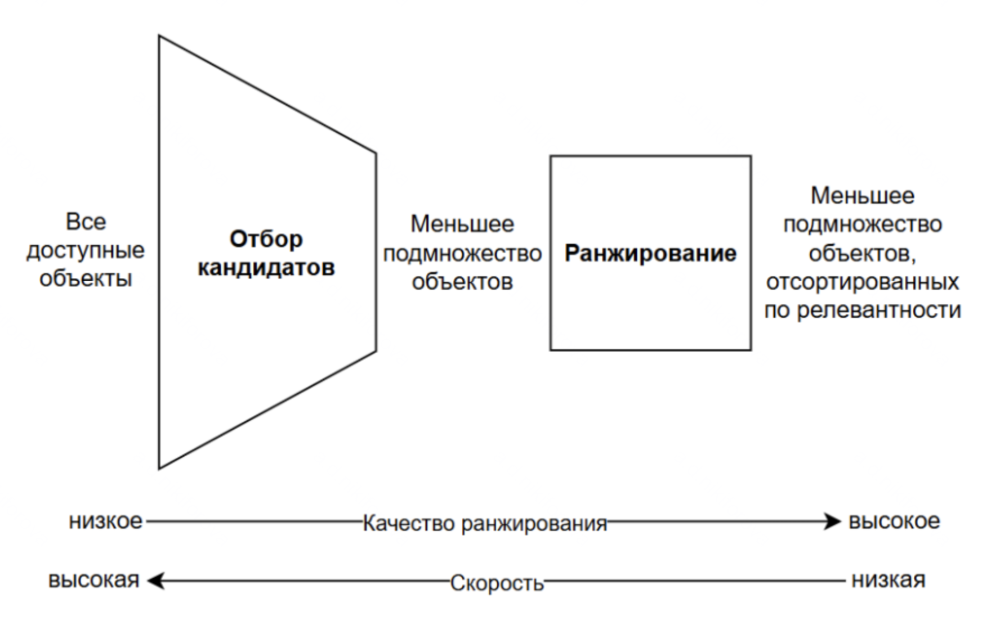

## Метрики

Онлайн и оффлайн метрики. Онлайн-метрики замеряют на проде "в моменте", оффлайн-метрики можно посчитать на исторических данных.

Два вида оффлайн-метрик - метрики качества (HitRate, Precision, Recall, MRR, MAP, NDCG) и метрики разнообразия (Coverage, Diversity, Serendipity, ILS). Держим в уме feedback loop и off-policy evaluation!


Живем в парадигме "каталог и выдача". Выдача может быть разного размера. Логично ставить на первые позиции более релевантные айтемы, ведь пользователь может и не долистать до конца.

Чтобы учесть при расчете метрик различный размер выдачи, можем считать метрики @k (cutoff) - обрезаем выдачу до первых k элементов и считаем метрики по ней.

# Построим свою рекомендательную систему

Будем работать с датасетом "всех времен и народов" MovieLens.

[Dataset](https://grouplens.org/datasets/movielens/)

[IMDb.com](https://www.imdb.com/)

In [1]:
import math
import os
import zipfile
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor
from dataclasses import dataclass
from io import BytesIO
from math import log2
from abc import ABC, abstractmethod
from implicit.als import AlternatingLeastSquares
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import requests
from bs4 import BeautifulSoup
from PIL import Image
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import svds
from tqdm.notebook import tqdm

## Данные

Скачаем данные

In [6]:
response = requests.get("http://files.grouplens.org/datasets/movielens/ml-32m.zip", stream=True)
response.raise_for_status()

total_size = int(response.headers.get("content-length", 0))
with open("ml-32m.zip", "wb") as f:
    with tqdm(total=total_size) as pbar:
        for chunk in response.iter_content(chunk_size=1024):
            if chunk:
                f.write(chunk)
                pbar.update(len(chunk))

with zipfile.ZipFile("ml-32m.zip", "r") as zip_ref:
    zip_ref.extractall(".")

  0%|          | 0/238950008 [00:00<?, ?it/s]

И посмотрим на них. Мы испольузем библиотеку polars вместо pandas. Она обладает тем же функционалом, но поддерживает ленивые вычисления и потребляет меньше оперативной памяти

In [7]:
movies = pl.read_csv("ml-32m/movies.csv")
links = pl.read_csv("ml-32m/links.csv")  # Связка с IMDb айдишниками
movies = (
    movies
    .join(links, on="movieId")
    .rename({"imdbId": "item_id"})
    .select("item_id", "title", "genres")
)
movies.head()

item_id,title,genres
i64,str,str
114709,"""Toy Story (1995)""","""Adventure|Animation|Children|C…"
113497,"""Jumanji (1995)""","""Adventure|Children|Fantasy"""
113228,"""Grumpier Old Men (1995)""","""Comedy|Romance"""
114885,"""Waiting to Exhale (1995)""","""Comedy|Drama|Romance"""
113041,"""Father of the Bride Part II (1…","""Comedy"""


Рейтинги распределены от 0 до 5 с шагом 0.5

In [8]:
ratings = pl.read_csv("ml-32m/ratings.csv")

ratings = (
    ratings
    .join(links, on="movieId")
    .rename({"imdbId": "item_id", "userId": "user_id"})
    .select("user_id", "item_id", "rating")
)
ratings.head()

user_id,item_id,rating
i64,i64,f64
1,114388,4.0
1,113627,1.0
1,112682,2.0
1,115012,5.0
1,114746,5.0


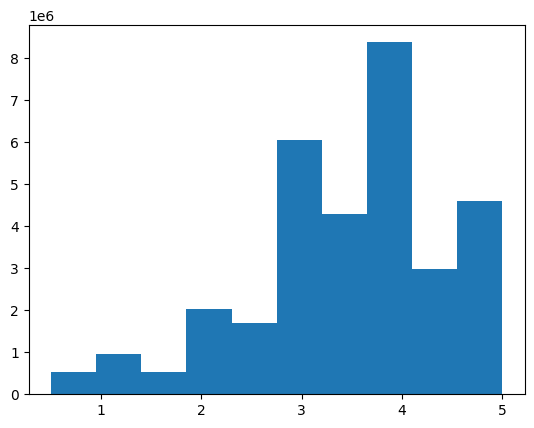

In [9]:
plt.hist(ratings["rating"]);

In [10]:
def display_posters(data, n_cols=5):
    """
    Отображает постеры фильмов из датасета

    Parameters:
    data (DataFrame): DataFrame с колонками 'item_id' и 'title'
    """
    def _get_poster_url(item_id):
        headers = {"User-Agent": "Mozilla/5.0"}
        processed_id = str(item_id).zfill(7)
        url = f'https://www.imdb.com/title/tt{processed_id}'
        try:
            response = requests.get(url, headers=headers, timeout=10)
            response.raise_for_status()
            soup = BeautifulSoup(response.text, "html.parser")
            poster_element = soup.find("img", {"class": "ipc-image"})
            if not poster_element:
                print(f"No poster found for movie ID {item_id}")
                return None
            return poster_element.get("src")
        except Exception as e:
            print(f"Error fetching poster for movie ID {item_id}: {e}")
            return None

    def _load_poster(row):
        item_id, title = row[0], row[1]
        try:
            poster_url = _get_poster_url(item_id)
            if not poster_url:
                return None, None
            response = requests.get(poster_url, timeout=10)
            response.raise_for_status()
        except Exception as e:
            print(f"Error loading poster for '{title}': {e}")
            return None, None
        return Image.open(BytesIO(response.content)), title

    data = data[["item_id", "title"]]
    num_movies = len(data)

    n_rows = math.ceil(num_movies / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))

    if n_rows == 1:
        axes = [axes]
    elif n_cols == 1:
        axes = [[ax] for ax in axes]

    rows = [row for row in data.iter_rows()]

    with ThreadPoolExecutor(max_workers=10) as executor:
        results = list(executor.map(_load_poster, rows))

    for idx, (img, title) in enumerate(results):
        row_idx = idx // n_cols
        col_idx = idx % n_cols

        ax = axes[row_idx][col_idx]

        if img and title:
            ax.imshow(img)
            ax.set_title(title, fontsize=12, pad=10)
        else:
            ax.set_title("Image not available", fontsize=12, pad=10)
        ax.axis("off")

    for idx in range(num_movies, n_rows * n_cols):
        row_idx = idx // n_cols
        col_idx = idx % n_cols
        axes[row_idx][col_idx].axis('off')
        axes[row_idx][col_idx].set_visible(False)

    plt.tight_layout()
    plt.show()

Посмотрим, какие фильмы являются самыми популярными

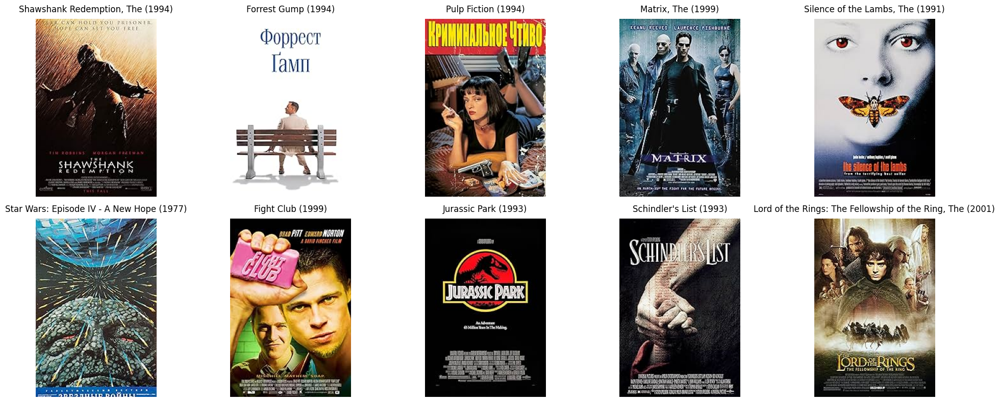

In [11]:
topn = 10

# Создадим pl.DataFrame("item_id", "title"), содержащий topn самых популярных по количеству рейтингов фильмов
toppop = ratings.group_by("item_id").agg(pl.col("user_id").n_unique()).sort("user_id", descending=True).head(topn).join(movies, on="item_id", how="left")

assert toppop.shape[0] == topn
assert toppop[0]["item_id"].item() == 111161 and toppop[0]["title"].item() == "Shawshank Redemption, The (1994)"

display_posters(toppop)

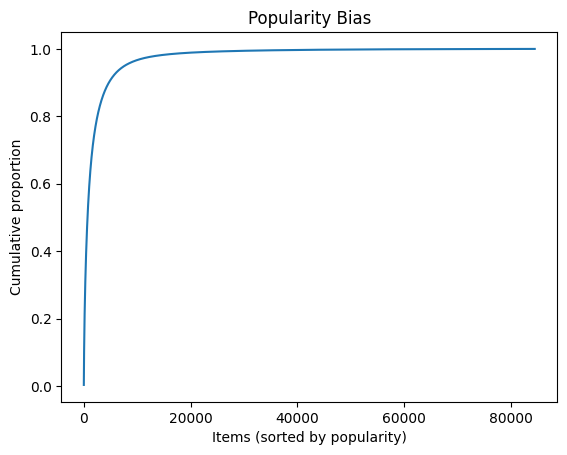

In [12]:
plt.plot(
    ratings["item_id"]
    .value_counts(normalize=True)
    .sort("proportion", descending=True)
    ["proportion"]
    .cum_sum()
)
plt.title("Popularity Bias")
plt.xlabel("Items (sorted by popularity)")
plt.ylabel("Cumulative proportion")
plt.show()

Разделим данные на train-test

In [13]:
def train_test_split(
    ratings: pl.DataFrame,
    k_core: int = 20,
    test_percentage: float = 0.2,
    seed: int = 42
) -> tuple[pl.DataFrame, pl.DataFrame]:

    # k-core фильтрация (в идеале стоит делать через while - почему?)
    user_counts = ratings.group_by("user_id").agg(pl.len())
    valid_users = user_counts.filter(pl.col("len") >= k_core)["user_id"]

    item_counts = ratings.group_by("item_id").agg(pl.len())
    valid_items = item_counts.filter(pl.col("len") >= k_core)["item_id"]

    filtered = ratings.filter(
        pl.col("user_id").is_in(valid_users) &
        pl.col("item_id").is_in(valid_items)
    )

    # Добавляем разметку на трейн/тест
    result_df = (
        filtered
        # А будет ли лик? Если да, то какой?
        .sample(fraction=1.0, shuffle=True, seed=seed)
        .with_columns(
            # Случайное число для каждого взаимодействия пользователя
            random_val=pl.arange(0, pl.len()).over("user_id"),
            # Общее количество взаимодействий пользователя
            user_count=pl.len().over("user_id")
        )
        .with_columns(
            # Нормализованное случайное значение
            norm_random=pl.col("random_val") / pl.col("user_count")
        )
        .with_columns(
            # Выделяем определенный процент на тест
            is_test=pl.col("norm_random") < test_percentage
        )
    )

    # Финально разделяем на train и test
    train = result_df.filter(pl.col("is_test") == False).drop(["random_val", "user_count", "norm_random", "is_test"])
    test = result_df.filter(pl.col("is_test") == True).drop(["random_val", "user_count", "norm_random", "is_test"])

    return train, test

In [14]:
train, test = train_test_split(
    ratings[:1_500_000],  # Чтобы побыстрее считалось
    k_core=10,
    test_percentage=0.1,
    seed=42
)

assert round(len(test) / (len(train) + len(test)), 1) == 0.1

In [15]:
display(train.head())
display(test.head())

user_id,item_id,rating
i64,i64,f64
8401,241527,5.0
2040,117333,5.0
5242,180093,4.5
1464,116136,5.0
1202,1853728,3.5


user_id,item_id,rating
i64,i64,f64
9406,116996,4.0
1574,3110958,4.0
4406,112749,2.0
9332,97441,4.0
2037,1139797,4.0


Приведем test в более удобный для расчета метрик формат

In [16]:
test = test.sort("rating", descending=True).group_by("user_id").agg(pl.col("item_id"))
display(test.head())

user_id,item_id
i64,list[i64]
7619,"[350258, 76759, … 286106]"
5785,"[48473, 103767, … 266697]"
7759,"[83658, 167404, … 349683]"
33,"[82971, 48021, … 120179]"
6693,"[108052, 107290, … 117060]"


Давайте добавим в train-test себя, чтобы в дальнейшем была возможность посмотреть персональные рекомендации.

Узнать айдишник фильма можно на сайте в адресной строке:
* https://www.imdb.com/title/tt0468569 -> id=468569 (без нулей вначале)

In [17]:
SELF_USER_ID = -1

self_item_ids = [1840309, 1790864, 1392170]  # Divergent, The Maze Runner, The Hunger Games
self_rating = [5.0, 5.0, 5.0]

self_profile = pl.DataFrame(
    {
      "user_id": [SELF_USER_ID] * len(self_item_ids),
      "item_id": self_item_ids,
      "rating": self_rating
    }
)

train = pl.concat([train, self_profile])
train

user_id,item_id,rating
i64,i64,f64
8401,241527,5.0
2040,117333,5.0
5242,180093,4.5
1464,116136,5.0
1202,1853728,3.5
…,…,…
2860,1186370,3.0
1547,388795,2.5
-1,1840309,5.0


## Models (Finally)

Создадим базовый класс рекоммендера, от которого будет удобно наследоваться

In [18]:
class BaseRecommender:
    def __init__(
        self,
        interactions: pl.DataFrame,
        user_col: str = "user_id",
        item_col: str = "item_id",
        interactions_col: str = "rating",
    ):
        self.user_col = user_col
        self.item_col = item_col
        self.interactions_col = interactions_col

        # В рекомендашках почти всегда лучше работать с матрицами
        self.id2user = np.array(interactions[user_col].unique())
        self.id2item = np.array(interactions[item_col].unique())
        self.user2id = {uid: idx for idx, uid in enumerate(self.id2user)}
        self.item2id = {uid: idx for idx, uid in enumerate(self.id2item)}

        rows = [self.user2id[i] for i in interactions[user_col]]
        cols = [self.item2id[i] for i in interactions[item_col]]

        # Будем исходить из идеи, что если фильм оценен, значит он как минимум привлек внимание
        data = [1 for i in interactions[interactions_col]]
        # Матрица U*I
        self.interactions_matrix = csr_matrix(
            (data, (rows, cols)),
            dtype=np.float32,
        )
        # Матрица I*U
        self.interactions_matrix_t = self.interactions_matrix.T

        # А тут просто рейтинги
        self.ratings_matrix = csr_matrix(
            (interactions[interactions_col], (rows, cols)),
            dtype=np.float32,
        )

        # Кол-во ненулевых интеракций для юзеров/айтемов
        self.row_lengths = np.array(self.interactions_matrix.getnnz(axis=1)).ravel()
        self.col_lengths = np.array(self.interactions_matrix.getnnz(axis=0)).ravel()

    def _get_user_items(self, user_idx: int) -> set[int]:
        # Полезно для фильтрации просмотренных
        return set(self.id2item[self.interactions_matrix[user_idx].indices])

    def find_similar_items(self, item_id: int, topn: int = 10) -> list[int]:
        # Один айтем - попроще
        raise NotImplementedError

    def recommend_to_users(self, user_ids: list, topn: int = 10) -> dict[int, list[int]]:
        # Список юзеров - посложнее
        raise NotImplementedError

Заглянем внутрь

In [19]:
base = BaseRecommender(train)

In [20]:
user_ids = [SELF_USER_ID, 1, 2]
user_indices = [base.user2id[uid] for uid in user_ids]
user_indices

[0, 1, 2]

In [21]:
base.id2user[user_indices]

array([-1,  1,  2])

In [22]:
base.interactions_matrix

<9519x9279 sparse matrix of type '<class 'numpy.float32'>'
	with 1295514 stored elements in Compressed Sparse Row format>

In [23]:
base.interactions_matrix_t

<9279x9519 sparse matrix of type '<class 'numpy.float32'>'
	with 1295514 stored elements in Compressed Sparse Column format>

In [24]:
base.interactions_matrix[user_indices]

<3x9279 sparse matrix of type '<class 'numpy.float32'>'
	with 175 stored elements in Compressed Sparse Row format>

In [25]:
base.interactions_matrix[base.user2id[SELF_USER_ID]].nonzero()

(array([0, 0, 0], dtype=int32), array([7388, 7809, 7846], dtype=int32))

In [26]:
base.id2item[base.interactions_matrix[base.user2id[SELF_USER_ID]].nonzero()[1]]

array([1392170, 1790864, 1840309])

In [27]:
base.row_lengths.shape

(9519,)

In [28]:
base.col_lengths.shape

(9279,)

### Jaccard Similarity

Вполне себе вариация метода ближайших соседей. Найдем ближайших к пользователю соседей по мере Жаккара (по просмотрам), просуммируем частотности просмотров фильмов среди найденных соседей, отбросив уже просмотренные пользователем -> получим рекомендации

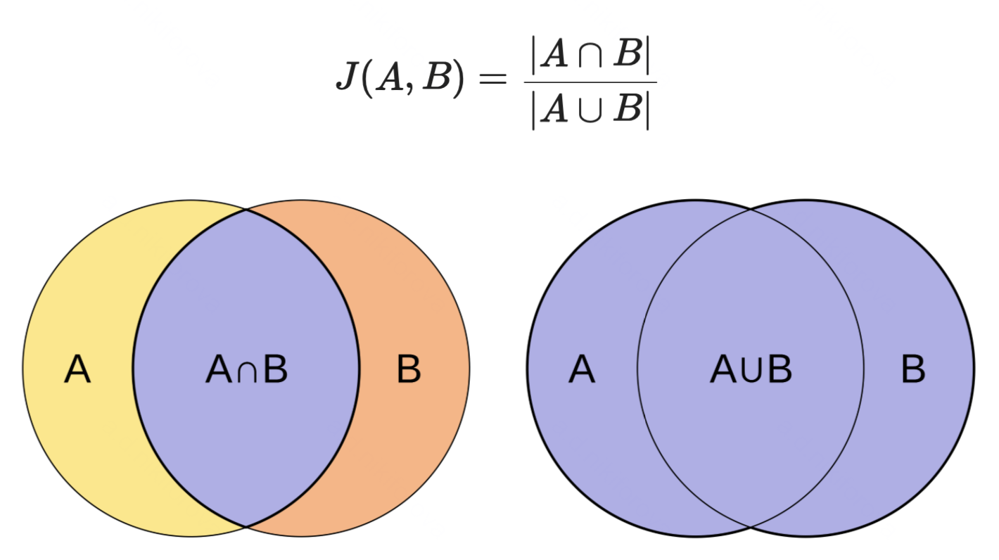

* В find_similar_items будем искать айтемы с самым высоким коэффициентом Жаккара в текущему

* В recommend_to_users будем искать похожих пользователей по коэффициенту Жаккара, а затем формировать из их взаимодействий рекомендации для пользователя

In [29]:
class JaccardRecommender(BaseRecommender):
    def __init__(self, interactions: pl.DataFrame, user_col: str = "user_id",
                 item_col: str = "item_id", interactions_col: str = "rating"):
        super().__init__(interactions, user_col, item_col, interactions_col)
        # Для стабилизации знаменателя при делении
        self.alpha = 0.001

    def find_similar_items(self, item_id: int, topn: int = 10) -> list[int]:
        if item_id not in self.item2id:
            return []

        item_idx = self.item2id[item_id]

        # Вычисляем пересечения. Hint: dot product по interactions_matrix_t
        intersections = (self.interactions_matrix_t[item_idx] @ self.interactions_matrix).toarray().squeeze(0)
        # Вычисляем объединения: |A| + |B| - |A ∩ B|
        unions = self.col_lengths[item_idx] + self.col_lengths - intersections
        # Вычисляем коэффициент Жаккара: |A ∩ B| / |A ∪ B|. Помним про self.alpha
        similarities = intersections / (unions + self.alpha)

        # Исключаем самосхожесть
        similarities[item_idx] = -np.inf

        # Сортируем по убыванию скора. Note: argpartition не гарантирует, что список будет отсортированным!
        top_indices = np.argpartition(-similarities, topn)[:topn]
        top_indices = top_indices[np.argsort(-similarities[top_indices])]

        return self.id2item[top_indices]

    def recommend_to_users(self, user_ids: list, topn: int = 10, k_neighbours: int = 10) -> dict[int, list[int]]:
        recommendations = {}
        user_indices = np.array([self.user2id[uid] for uid in user_ids if uid in self.user2id])

        if not len(user_indices):
            return {}

        # Вычисляем пересечения. Hint: dot product по interactions_matrix
        intersections = (self.interactions_matrix[user_indices] @ self.interactions_matrix.T).toarray()
        # Вычисляем объединения: |A| + |B| - |A ∩ B|. Удобно воспользоваться np.newaxis
        unions = self.row_lengths[user_indices][:, np.newaxis] + self.row_lengths - intersections
        # Вычисляем коэффициент Жаккара: |A ∩ B| / |A ∪ B|. Помним про self.alpha
        similarities = intersections / (unions + self.alpha)

        # Исключаем самосхожесть
        similarities[np.arange(len(user_indices)), user_indices] = -np.inf

        # Находим k_neighbours похожих пользователей для каждого целевого
        top_sim_users = np.argpartition(-similarities, k_neighbours, axis=1)[:, :k_neighbours]

        for i, (uid, u_idx) in enumerate(zip(user_ids, user_indices)):
            # Получаем уже просмотренные айтемы
            seen_items = self._get_user_items(u_idx)

            item_scores = defaultdict(float)

            for neighbor_idx in top_sim_users[i]:
                if similarities[i, neighbor_idx] <= 0:
                    continue

                # Получаем айтемы соседа
                neighbor_items = self._get_user_items(neighbor_idx)

                # Суммируем скоры для непросмотренных айтемов
                for item in (neighbor_items - seen_items):
                    item_scores[item] += similarities[i, neighbor_idx]

            # Сортируем по убыванию скора
            top_items = sorted(item_scores.items(), key=lambda para: -para[1])[:topn]
            recommendations[uid] = [item for item, score in top_items]

        return recommendations

In [30]:
%%time
jaccard = JaccardRecommender(train)

CPU times: user 791 ms, sys: 28.2 ms, total: 819 ms
Wall time: 787 ms


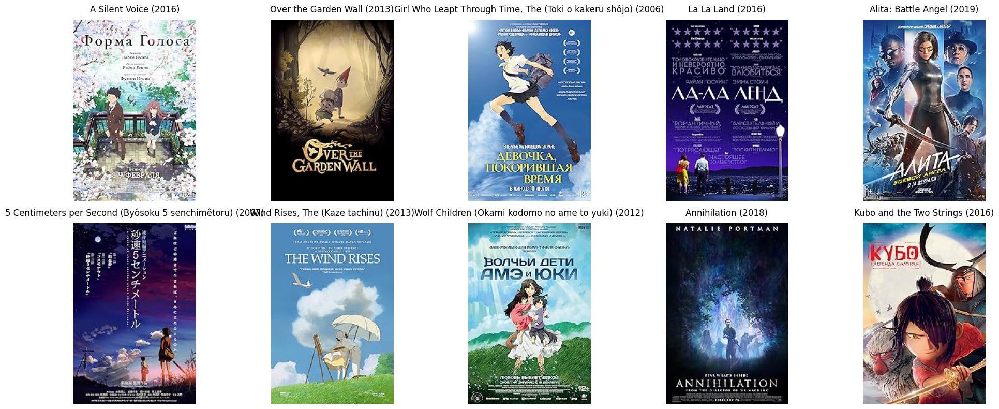

In [31]:
# Harry Potter and the Sorcerer's Stone: 241527
# Spider Man: 145487
# Your Name: 5311514

item_id = 5311514

recommendations = jaccard.find_similar_items(item_id, 10)
recommendations = pl.DataFrame({"item_id": recommendations})
recommendations = movies.join(recommendations, on="item_id", how="right")
display_posters(recommendations)

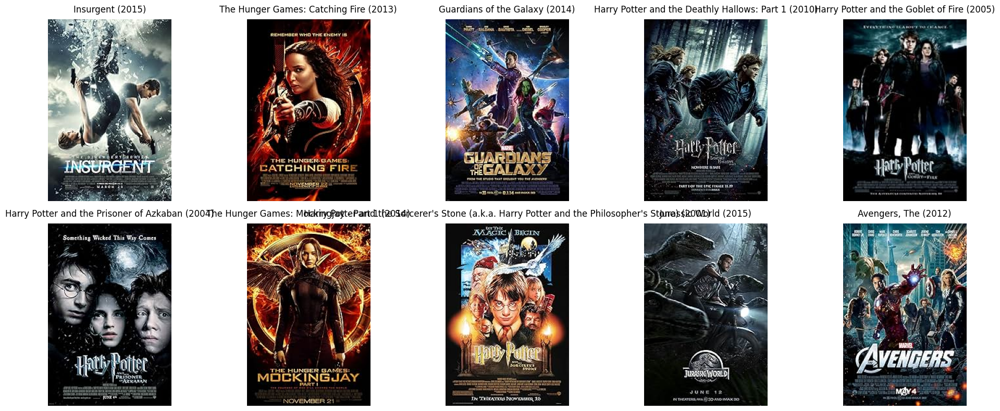

In [32]:
recommendations = jaccard.recommend_to_users([SELF_USER_ID], topn=10, k_neighbours=5)  # Попробуйте поварьировать число соседей
recommendations = pl.DataFrame({"item_id": recommendations[SELF_USER_ID]})
recommendations = movies.join(recommendations, on="item_id", how="right")
display_posters(recommendations)

#### Оценим качество

In [33]:
%%time
jaccard_recommendations = jaccard.recommend_to_users(test["user_id"], topn=10, k_neighbours=5)

CPU times: user 6.99 s, sys: 607 ms, total: 7.6 s
Wall time: 7.64 s


In [34]:
test = test.with_columns(jaccard_recommendations=pl.Series(jaccard_recommendations.values()))
display(test.head())

user_id,item_id,jaccard_recommendations
i64,list[i64],list[i64]
7619,"[350258, 76759, … 286106]","[110622, 110148, … 94012]"
5785,"[48473, 103767, … 266697]","[364569, 338013, … 105236]"
7759,"[83658, 167404, … 349683]","[94226, 100405, … 103639]"
33,"[82971, 48021, … 120179]","[68646, 109686, … 82971]"
6693,"[108052, 107290, … 117060]","[106977, 107290, … 111280]"


Для оценки рассчитаем пару простых метрик, которые всем знакомы, - Precision и Recall. И упрощенную варицию Recall - HitRate.

Нотация:
- $k$ - первые $k$ рекомендаций, по которым считается метрика
- $U$ — множество пользователей
- $I$ — множество элементов
- $\mathbb{I}[\cdot]$ — индикаторная функция
- $S_u^{(k)} = [i_1, i_2, ..., i_k]$ — упорядоченный список из $k$ рекомендаций для пользователя $u \in U$
- $T_u \subset I$ — множество релевантных (целевых) элементов для пользователя $u$


**Precision (Точность)**

Показывает долю релевантных айтемов среди всех рекомендованных.

Precision на уровне пользователя определяется как:

$
\text{Precision}(u, k) = \frac{| S_u^{(k)} \cap T_u |}{k}
$

In [35]:
def precision(recommendations, ground_truth, k=100):
    """
    Calculate Precision@k

    Args:
        recommendations: list of lists [[user1_recs], [user2_recs], ...]
        ground_truth: list of lists [[user1_truth], [user2_truth], ...]
        k: cutoff level
    """
    total_precision = 0
    total_users = len(recommendations)
    users_with_recs = 0

    for i in tqdm(range(total_users), leave=False):
        user_recs = recommendations[i][:k]
        user_truth = ground_truth[i]

        if not len(user_recs):  # If no recommendations, skip
            continue

        relevant_count = len(set(user_recs) & set(user_truth))
        user_precision = relevant_count / len(user_recs)
        total_precision += user_precision
        users_with_recs += 1

    return total_precision / users_with_recs if users_with_recs > 0 else 0.0


prec_val = precision([[5, 3, 1, 4], [2, 3, 1, 5]], [[1, 2, 3, 4, 5], [1, 3, 4, 5]], 3)
assert abs(prec_val - 0.833) < 0.001, f"Expected Precision 0.833, got {prec_val}"

  0%|          | 0/2 [00:00<?, ?it/s]

**Recall (Полнота)**

Показывает долю релевантных айтемов, которые были успешно найдены системой, от общего числа целевых айтемов.

Recall на уровне пользователя определяется как:

$
\text{Recall}(u, k) = \frac{| S_u^{(k)} \cap T_u |}{|T_u|}
$

In [36]:
def recall(recommendations, ground_truth, k=100):
    """
    Calculate Recall@k

    Args:
        recommendations: list of lists [[user1_recs], [user2_recs], ...]
        ground_truth: list of lists [[user1_truth], [user2_truth], ...]
        k: cutoff level
    """
    total_recall = 0
    total_users = len(recommendations)

    for i in tqdm(range(total_users), leave=False):
        user_recs = recommendations[i][:k]
        user_truth = ground_truth[i]

        if not len(user_truth):  # If no ground truth items, skip
            continue

        relevant_count = len(set(user_recs) & set(user_truth))
        user_recall = relevant_count / len(user_truth)
        total_recall += user_recall

    return total_recall / total_users if total_users > 0 else 0.0


rec_val = recall([[5, 3, 1, 4], [2, 3, 1, 5]], [[1, 2, 3, 4, 5], [1, 3, 4, 5]], 3)
assert abs(rec_val - 0.55) < 0.001, f"Expected Recall 0.55, got {rec_val}"

  0%|          | 0/2 [00:00<?, ?it/s]

**HitRate**

Показывает, оказался ли хотя бы один релевантный айтем в рекомендациях.

HitRate на уровне пользователя определяется как:

$
\text{HitRate}(u, k) = \mathbb{I} \left[ S_u^{(k)} \cap T_u \neq \emptyset \right]
$

In [37]:
def hitrate(recommendations, ground_truth, k=100):
    """
    Calculate HitRate@k

    Args:
        recommendations: list of lists [[user1_recs], [user2_recs], ...]
        ground_truth: list of lists [[user1_truth], [user2_truth], ...]
        k: cutoff level
    """
    total_hits = 0
    total_users = len(recommendations)

    for i in tqdm(range(total_users), leave=False):
        user_recs = recommendations[i][:k]
        user_truth = ground_truth[i]

        if not len(user_truth):  # If no ground truth items, skip
            continue

        hits = len(set(user_recs) & set(user_truth)) > 0
        total_hits += int(hits)

    return total_hits / total_users if total_users > 0 else 0.0


hit_val = hitrate([[5, 3, 1, 4], [2, 3, 1, 5]], [[1, 2, 3, 4, 5], [1, 3, 4, 5]], 1)
assert abs(hit_val - 0.5) < 0.001, f"Expected HitRate 0.5, got {hit_val}"

hit_val = hitrate([[5, 3, 1, 4], [2, 3, 1, 5]], [[1, 2, 3, 4, 5], [1, 3, 4, 5]], 3)
assert abs(hit_val - 1.0) < 0.001, f"Expected HitRate 1.0, got {hit_val}"

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

In [39]:
print(f'Precision@10: {round(precision(recommendations=test["jaccard_recommendations"], ground_truth=test["item_id"], k=10), 3)}')
print(f'Recall@10: {round(recall(recommendations=test["jaccard_recommendations"], ground_truth=test["item_id"], k=10), 3)}')
print(f'HitRate@10: {round(hitrate(recommendations=test["jaccard_recommendations"], ground_truth=test["item_id"], k=10), 3)}')

  0%|          | 0/9518 [00:00<?, ?it/s]

Precision@10: 0.149


  0%|          | 0/9518 [00:00<?, ?it/s]

Recall@10: 0.171


  0%|          | 0/9518 [00:00<?, ?it/s]

HitRate@10: 0.707


### [SVD](https://www.dataminingapps.com/2020/02/singular-value-decomposition-in-recommender-systems/)

Идея в том, чтобы приблизить матрицу интеракций, исключив из неё шум за счет удаления малых сингулярных значений

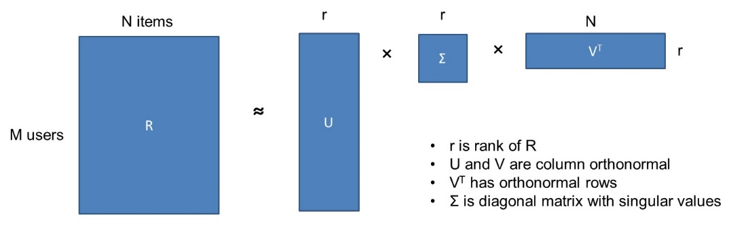

In [40]:
class SVDRecommender(BaseRecommender):
    def __init__(
        self,
        interactions: pl.DataFrame,
        user_col: str = "user_id",
        item_col: str = "item_id",
        interactions_col: str = "rating",
        n_factors: int = 50
    ):
        super().__init__(interactions, user_col, item_col, interactions_col)

        # Ограничиваем количество факторов, чтобы не превысить размерность матрицы
        self.n_factors = min(n_factors, min(self.ratings_matrix.shape) - 1)

        # SVD разложение разреженной матрицы оценок
        # scipy.sparse.linalg.svds возвращает U, S, Vt, где:
        # U - пользовательские факторы (n_users x n_factors)
        # S - диагональная матрица сингулярных значений
        # Vt - транспонированные item факторы (n_factors x n_items)
        self.U, self.S, self.Vt = svds(self.ratings_matrix, k=self.n_factors)

        # Item sim = Vt^T * Vt (ковариационная матрица в латентном пространстве)
        # Позволяет быстро находить похожие айтемы
        self.item_similarity_matrix = (self.Vt.T @ self.Vt)

        # Предварительно вычисляем все предсказанные оценки для всех пользователей
        # Формула: U * S * Vt (восстановленная матрица оценок)
        self.user_scores = (self.U @ np.diag(self.S) @ self.Vt)

    def find_similar_items(self, item_id: int, topn: int = 10) -> list[int]:
        if item_id not in self.item2id:
            return []

        item_idx = self.item2id[item_id]

        # Вычисляем схожести айтемов
        similarities = self.item_similarity_matrix[item_idx] @ self.item_similarity_matrix.T

        # Исключаем самосхожесть
        similarities[item_idx] = -np.inf

        # Сортируем по убыванию скора. Note: argpartition не гарантирует, что список будет отсортированным!
        top_indices = np.argpartition(-similarities, topn)[:topn]
        top_indices = top_indices[np.argsort(-similarities[top_indices])]

        return self.id2item[top_indices]

    def recommend_to_users(self, user_ids: list[str], topn: int = 10) -> dict[str, list[str]]:
        recommendations = {}
        user_indices = np.array([self.user2id[uid] for uid in user_ids if uid in self.user2id])

        if not len(user_indices):
            return {}

        # Получаем предрассчитанные скоры для выбранных пользователей
        scores = self.user_scores[user_indices]

        # Исключаем уже просмотренные
        viewed_mask = self.interactions_matrix[user_indices].toarray().astype(bool)
        scores[viewed_mask] = -np.inf

        # Получаем топ
        top_indices = np.argpartition(-scores, topn, axis=1)[:, :topn]

        # Сортируем топовые индексы внутри каждой строки. Удобно использовать np.take_along_axis
        sorted_indices = np.argsort(-np.take_along_axis(scores, top_indices, axis=1), axis=1)
        top_indices = np.take_along_axis(top_indices, sorted_indices, axis=1)

        # Формируем и возвращаем рекомендации
        for i, uid in enumerate(user_ids):
            if i < len(user_indices):
                recs = self.id2item[top_indices[i]]
                recommendations[uid] = recs
            else:
                recommendations[uid] = []

        return recommendations

In [41]:
%%time
svd = SVDRecommender(train, n_factors=60)  # Попробуйте поварьировать количество факторов

CPU times: user 10.7 s, sys: 4.21 s, total: 14.9 s
Wall time: 2.42 s


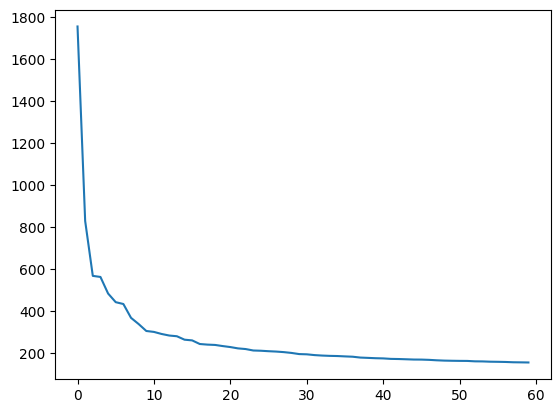

In [42]:
plt.plot(sorted(svd.S, reverse=True));

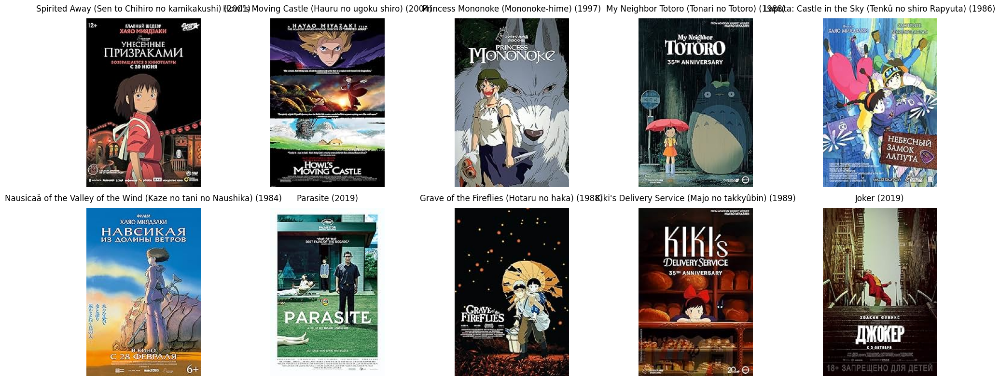

In [43]:
item_id = 5311514

recommendations = svd.find_similar_items(item_id, 10)
recommendations = pl.DataFrame({"item_id": recommendations})
recommendations = movies.join(recommendations, on="item_id", how="right")
display_posters(recommendations)

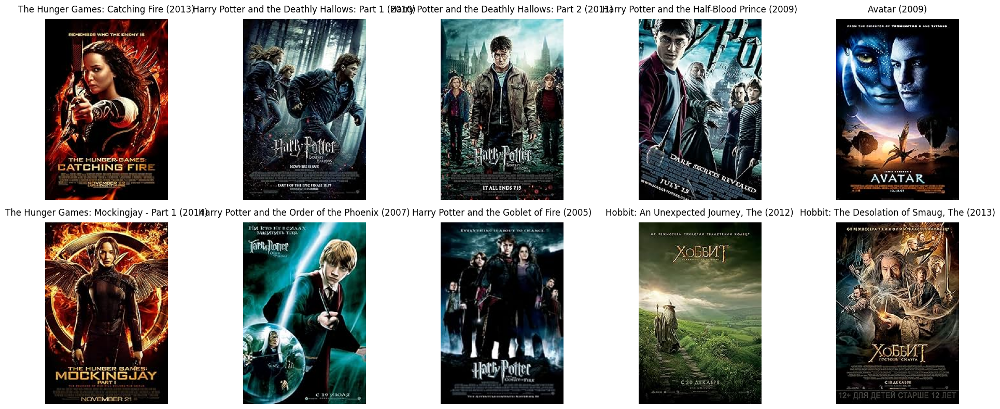

In [44]:
recommendations = svd.recommend_to_users([SELF_USER_ID], topn=10)
recommendations = pl.DataFrame({"item_id": recommendations[SELF_USER_ID]})
recommendations = movies.join(recommendations, on="item_id", how="right")
display_posters(recommendations)

#### Оценим качество

In [45]:
%%time
svd_recommendations = svd.recommend_to_users(test["user_id"], topn=10)

CPU times: user 831 ms, sys: 163 ms, total: 994 ms
Wall time: 999 ms


In [46]:
test = test.with_columns(svd_recommendations=pl.Series(svd_recommendations.values()))
print(f'Precision@10: {round(precision(recommendations=test["svd_recommendations"], ground_truth=test["item_id"], k=10), 3)}')
print(f'Recall@10: {round(recall(recommendations=test["svd_recommendations"], ground_truth=test["item_id"], k=10), 3)}')
print(f'HitRate@10: {round(hitrate(recommendations=test["svd_recommendations"], ground_truth=test["item_id"], k=10), 3)}')

  0%|          | 0/9518 [00:00<?, ?it/s]

Precision@10: 0.217


  0%|          | 0/9518 [00:00<?, ?it/s]

Recall@10: 0.206


  0%|          | 0/9518 [00:00<?, ?it/s]

HitRate@10: 0.765


### ALS

Похожий на SVD метод, но использует классический ML-сетап обучения

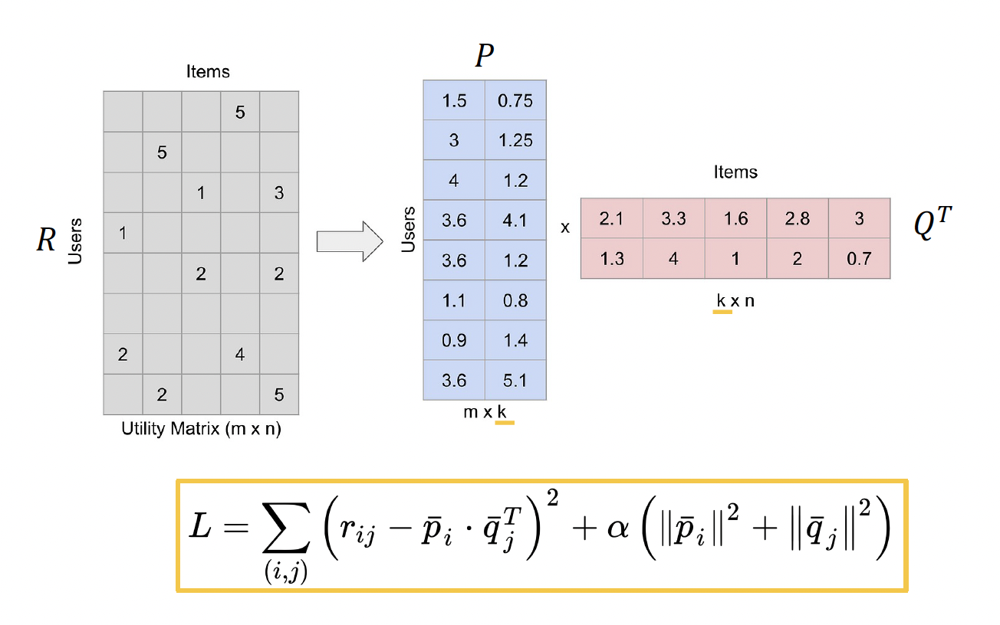

In [47]:
class ALSRecommender(BaseRecommender):
    def __init__(
        self,
        interactions: pl.DataFrame,
        user_col: str = "user_id",
        item_col: str = "item_id",
        interactions_col: str = "rating",
        factors: int = 50,
        iterations: int = 15,
        regularization: float = 0.01,
        random_state: int = 42
    ):
        super().__init__(interactions, user_col, item_col, interactions_col)

        # Параметры ALS
        self.factors = min(factors, min(self.ratings_matrix.shape) - 1)
        self.iterations = iterations
        self.regularization = regularization
        self.random_state = random_state

        # Обучаем модель
        self.model = AlternatingLeastSquares(
            factors=self.factors,
            iterations=self.iterations,
            regularization=self.regularization,
            random_state=self.random_state
        )

        # Рейтинг = степень доверия оценке
        confidence_matrix = self.ratings_matrix

        # Обучаем модель
        self.model.fit(confidence_matrix)

        # Получаем user и item факторы
        self.user_factors = self.model.user_factors
        self.item_factors = self.model.item_factors

        # Предвычисляем матрицу схожести айтемов для быстрого поиска похожих
        self.item_similarity_matrix = self.item_factors @ self.item_factors.T

    def find_similar_items(self, item_id: int, topn: int = 10) -> list[int]:
        if item_id not in self.item2id:
            return []

        item_idx = self.item2id[item_id]

        # Используем предвычисленную матрицу схожести
        similarities = self.item_similarity_matrix[item_idx]

        # Исключаем сам айтем
        similarities[item_idx] = -np.inf

        # Получаем топ-N наиболее похожих айтемов
        top_indices = np.argpartition(-similarities, topn)[:topn]
        top_indices = top_indices[np.argsort(-similarities[top_indices])]

        return [self.id2item[idx] for idx in top_indices]

    def recommend_to_users(self, user_ids: list, topn: int = 10) -> dict[int, list[int]]:
        recommendations = {}

        # Фильтруем пользователей, которые есть в нашей матрице
        valid_user_ids = [uid for uid in user_ids if uid in self.user2id]
        if not valid_user_ids:
            return {}

        user_indices = np.array([self.user2id[uid] for uid in valid_user_ids])

        # Получаем рекомендации используя встроенный метод implicit
        # Метод recommend возвращает (item_indices, scores)
        recommended_items = []
        for user_idx in user_indices:
            items, _ = self.model.recommend(
                user_idx,
                self.interactions_matrix[user_idx],
                N=topn,
                filter_already_liked_items=True
            )
            recommended_items.append(items)

        # Формируем словарь рекомендаций
        for i, user_id in enumerate(valid_user_ids):
            item_indices = recommended_items[i]
            recommendations[user_id] = [self.id2item[idx] for idx in item_indices]

        # Добавляем пустые списки для пользователей не найденных в данных
        for user_id in user_ids:
            if user_id not in recommendations:
                recommendations[user_id] = []

        return recommendations

In [48]:
als = ALSRecommender(train, factors=60, iterations=20, regularization=0.1)  # Попробуйте другие гиперпараметры

/Users/a.d.nikiforova/.pyenv/versions/3.11.10/lib/python3.11/site-packages/implicit/cpu/als.py:95: RuntimeWarning: OpenBLAS is configured to use 10 threads. It is highly recommended to disable its internal threadpool by setting the environment variable 'OPENBLAS_NUM_THREADS=1' or by calling 'threadpoolctl.threadpool_limits(1, "blas")'. Having OpenBLAS use a threadpool can lead to severe performance issues here.
  check_blas_config()


  0%|          | 0/20 [00:00<?, ?it/s]

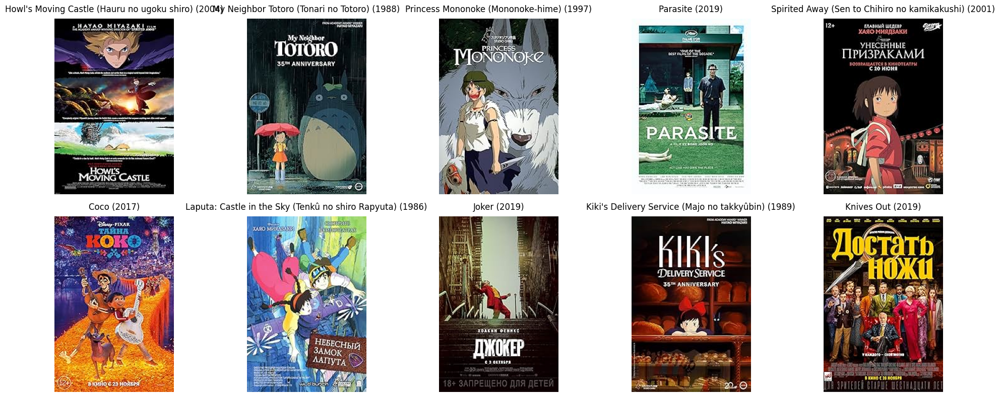

In [49]:
item_id = 5311514

recommendations = als.find_similar_items(item_id, 10)
recommendations = pl.DataFrame({"item_id": recommendations})
recommendations = movies.join(recommendations, on="item_id", how="right")
display_posters(recommendations)

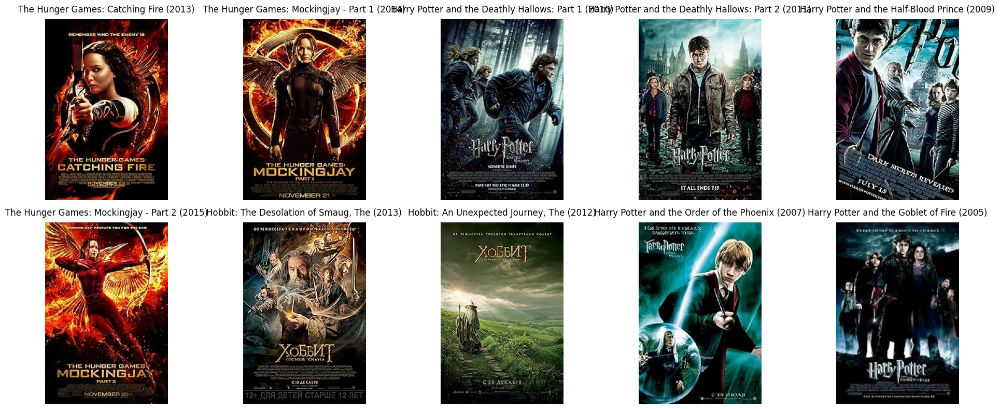

In [51]:
recommendations = als.recommend_to_users([SELF_USER_ID], topn=10)
recommendations = pl.DataFrame({"item_id": recommendations[SELF_USER_ID]})
recommendations = movies.join(recommendations, on="item_id", how="right")
display_posters(recommendations)

#### Оценим качество

In [52]:
%%time
als_recommendations = als.recommend_to_users(test["user_id"], topn=10)

CPU times: user 15.9 s, sys: 606 ms, total: 16.5 s
Wall time: 1.83 s


In [53]:
test = test.with_columns(als_recommendations=pl.Series(als_recommendations.values()))
print(f'Precision@10: {round(precision(recommendations=test["als_recommendations"], ground_truth=test["item_id"], k=10), 3)}')
print(f'Recall@10: {round(recall(recommendations=test["als_recommendations"], ground_truth=test["item_id"], k=10), 3)}')
print(f'HitRate@10: {round(hitrate(recommendations=test["als_recommendations"], ground_truth=test["item_id"], k=10), 3)}')

  0%|          | 0/9518 [00:00<?, ?it/s]

Precision@10: 0.224


  0%|          | 0/9518 [00:00<?, ?it/s]

Recall@10: 0.224


  0%|          | 0/9518 [00:00<?, ?it/s]

HitRate@10: 0.793
